In [ ]:
import glob
import os
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
from PIL import Image
from torch.utils.data import DataLoader, Dataset
import io
import zipfile
import requests
from pycocotools.coco import COCO
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np
from PIL import ImageDraw

In [ ]:
!pip install -U ultralytics

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 593.5/593.5 kB 15.5 MB/s eta 0:00:00


In [ ]:
# Load model from torch
model = torch.hub.load("ultralytics/yolov5", "yolov5s", pretrained=True)

/usr/local/lib/python3.10/dist-packages/torch/hub.py:286: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
requirements: Ultralytics requirement "gitpython>=3.1.30" not found, attempting AutoUpdate...
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 

In [ ]:
# Get annotation from COCO
r = requests.get(
    "http://images.cocodataset.org/annotations/annotations_trainval2017.zip"
)
z = zipfile.ZipFile(io.BytesIO(r.content))
z.extractall()
coco = COCO("annotations/instances_val2017.json")

loading annotations into memory...
Done (t=0.65s)
creating index...
index created!


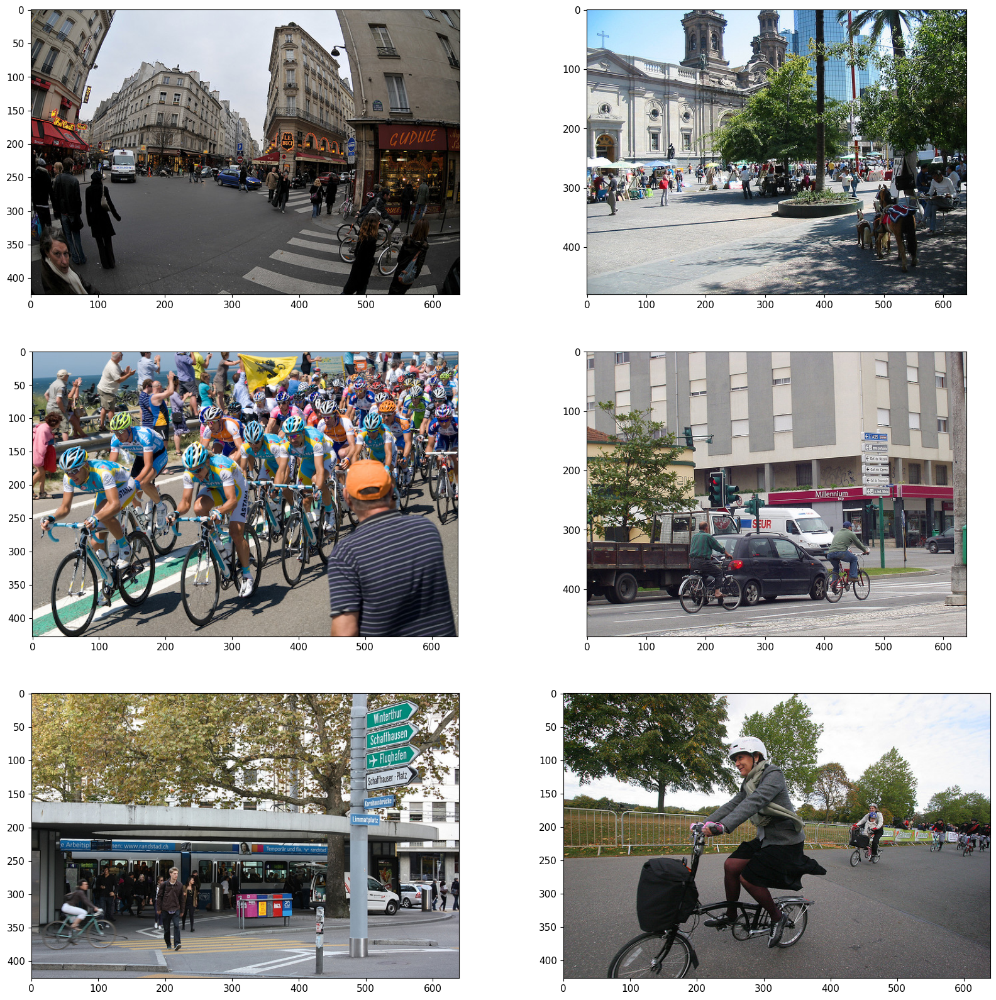

In [ ]:
%matplotlib inline

# load image from URL and convert it to pillow format
def url2pil(url):
    response = requests.get(url)
    return Image.open(BytesIO(response.content))


# https://stackoverflow.com/questions/19471814/display-multiple-images-in-one-ipython-notebook-cell
def show(images, columns=2):
    plt.figure(figsize=(20, 20))
    for i, image in enumerate(images):
        if(len(images) % columns == 0):
            plt.subplot(len(images) // columns, columns, i + 1)
        else:
            plt.subplot(len(images) // columns + 1, columns, i + 1)
        plt.imshow(np.asarray(image))


catIds = coco.getCatIds(catNms=["bicycle"])  # set category IDs

imgIds = coco.getImgIds(catIds=catIds)
images_list = coco.loadImgs(imgIds[:6])  # Take first 6 images

pil_images_list = []
for info in images_list:  # iterate by coco metainfo
    url = info["coco_url"]
    pil_images_list.append(url2pil(url))

show(pil_images_list)

In [ ]:
cats = coco.loadCats(coco.getCatIds())
print(cats)

[{'supercategory': 'person', 'id': 1, 'name': 'person'}, {'supercategory': 'vehicle', 'id': 2, 'name': 'bicycle'}, {'supercategory': 'vehicle', 'id': 3, 'name': 'car'}, {'supercategory': 'vehicle', 'id': 4, 'name': 'motorcycle'}, {'supercategory': 'vehicle', 'id': 5, 'name': 'airplane'}, {'supercategory': 'vehicle', 'id': 6, 'name': 'bus'}, {'supercategory': 'vehicle', 'id': 7, 'name': 'train'}, {'supercategory': 'vehicle', 'id': 8, 'name': 'truck'}, {'supercategory': 'vehicle', 'id': 9, 'name': 'boat'}, {'supercategory': 'outdoor', 'id': 10, 'name': 'traffic light'}, {'supercategory': 'outdoor', 'id': 11, 'name': 'fire hydrant'}, {'supercategory': 'outdoor', 'id': 13, 'name': 'stop sign'}, {'supercategory': 'outdoor', 'id': 14, 'name': 'parking meter'}, {'supercategory': 'outdoor', 'id': 15, 'name': 'bench'}, {'supercategory': 'animal', 'id': 16, 'name': 'bird'}, {'supercategory': 'animal', 'id': 17, 'name': 'cat'}, {'supercategory': 'animal', 'id': 18, 'name': 'dog'}, {'supercategory

In [ ]:
bicycle_coco_num = 2

In [ ]:
detections = model(pil_images_list)

In [ ]:
print(detections)

image 1/6: 425x640 16 persons, 4 bicycles, 7 cars, 1 motorcycle, 1 truck, 1 backpack
image 2/6: 480x640 14 persons, 1 horse, 5 umbrellas, 1 potted plant
image 3/6: 428x640 16 persons, 12 bicycles, 3 bottles
image 4/6: 480x640 2 persons, 2 bicycles, 2 cars, 3 trucks, 3 traffic lights
image 5/6: 426x640 13 persons, 1 bicycle, 2 cars, 1 train, 1 parking meter
image 6/6: 427x640 5 persons, 5 bicycles, 1 backpack
Speed: 1.8ms pre-process, 15.2ms inference, 1.1ms NMS per image at shape (6, 3, 480, 640)


In [ ]:
for i in range(3):
    print(i, detections.names[i])

0 person
1 bicycle
2 car


In [ ]:
bicycle_yolo_num = 1

In [ ]:
detections.pandas().xyxy[0].head()

,xmin,ymin,xmax,ymax,confidence,class,name
0,79.372429,239.081116,136.362198,386.803650,0.885454,0,person
1,30.345900,222.435593,80.996300,379.959290,0.858796,0,person
2,5.672234,332.148193,102.578300,423.223145,0.783005,0,person
3,349.873474,232.889862,369.344116,289.041412,0.737860,0,person
4,0.439987,214.382050,36.805733,349.909821,0.730170,0,person


In [ ]:
detections.xyxy[0][:5]  # show only 5 bbox from first image

tensor([[ 79.37243, 239.08112, 136.36220, 386.80365,   0.88545,   0.00000],
        [ 30.34590, 222.43559,  80.99630, 379.95929,   0.85880,   0.00000],
        [  5.67223, 332.14819, 102.57830, 423.22314,   0.78300,   0.00000],
        [349.87347, 232.88986, 369.34412, 289.04141,   0.73786,   0.00000],
        [  0.43999, 214.38205,  36.80573, 349.90982,   0.73017,   0.00000]], device='cuda:0')

In [ ]:
def xywh2xyxy(x1, y1, w, h):
    return [x1, y1, x1 + w, y1 + h]

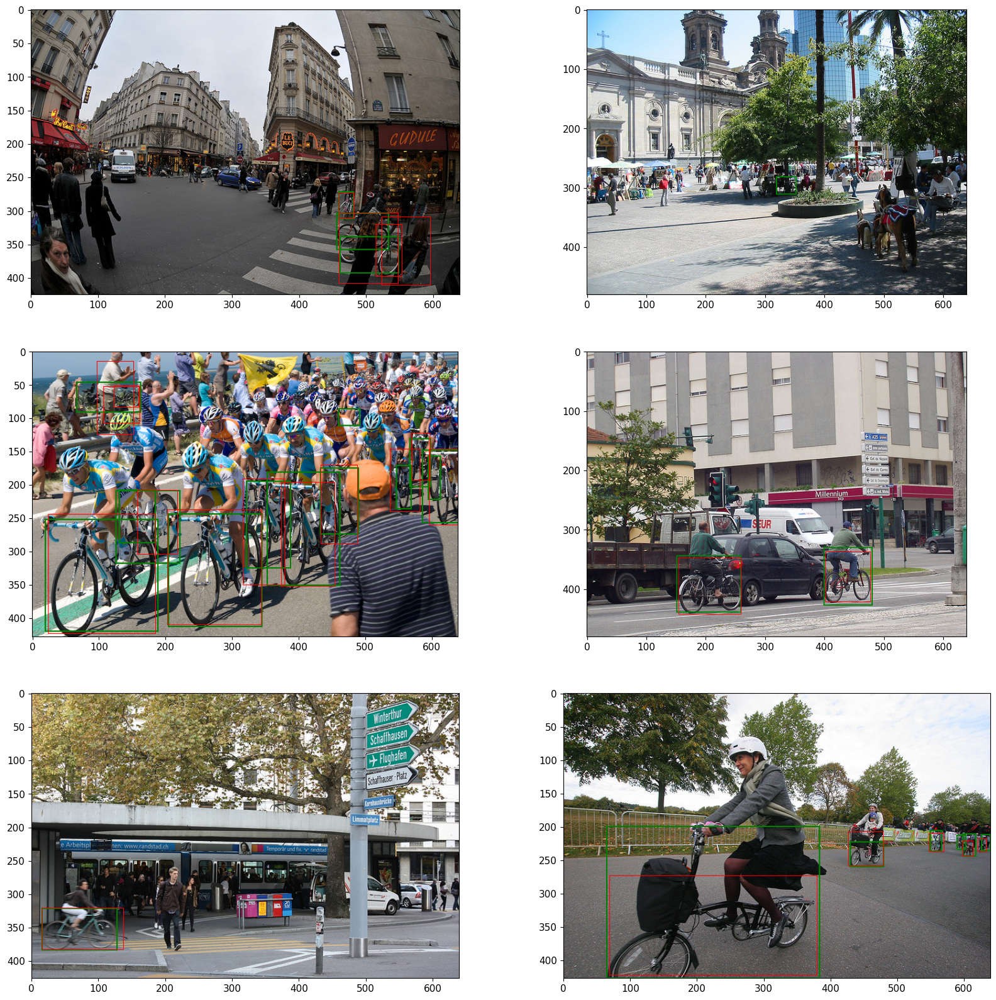

In [ ]:
for i, ann in enumerate(images_list):
    img = pil_images_list[i]
    annIds = coco.getAnnIds(imgIds=ann["id"])
    anns = coco.loadAnns(annIds)

    gt_bicycles = filter(lambda x: x["category_id"] == bicycle_coco_num, anns)

    draw = ImageDraw.Draw(img)
    for a in gt_bicycles:
        draw.rectangle(xywh2xyxy(*a["bbox"]), fill=None, outline="green", width=2)

    yolo_bicycles = filter(lambda d: d[..., -1] == bicycle_yolo_num, detections.xyxy[i])
    for bbox in yolo_bicycles:
        draw.rectangle(bbox[:4].tolist(), fill=None, outline="red", width=1)

show(pil_images_list)